<a href="https://colab.research.google.com/github/ArifAygun/Iron-Ore-Froth-Flotation-Quality-Prediction/blob/main/AA_Graduate_Project_Silica.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Quality Prediction of Iron Ore Mining Flotation Process**

# **(Silica Concentrate)**

## **1. Problem Definition**

**Gangue concentrate predict in the reverse cationic flotation:**


Mined ores are mostly mixtures of extractable minerals and nonvaluable material (gangue). Mineral processing (e.g. ore dressing, ore beneficiation) follows mining and prepares the ore for extraction of the valuable metal. A principal step in mineral processing is physical separation of the particles of valuable minerals from the gangue, to produce an enriched portion (concentrate) containing most of the valuable minerals, and a discard (tailing) containing predominantly the gangue.

A separation of minerals by exploiting difference of surface properties (hydrophobicity) is called flotation. **The reverse cationic flotation** is commonly used to separate iron from silica. By adjusting the 'chemistry' of the pulp by adding various chemical reagents, iron minerals remain in the water and create sediment with a high concentration of iron (valuable minerals). At the same time, silica particles (gangue) attach to air bubbles and float to the surface.

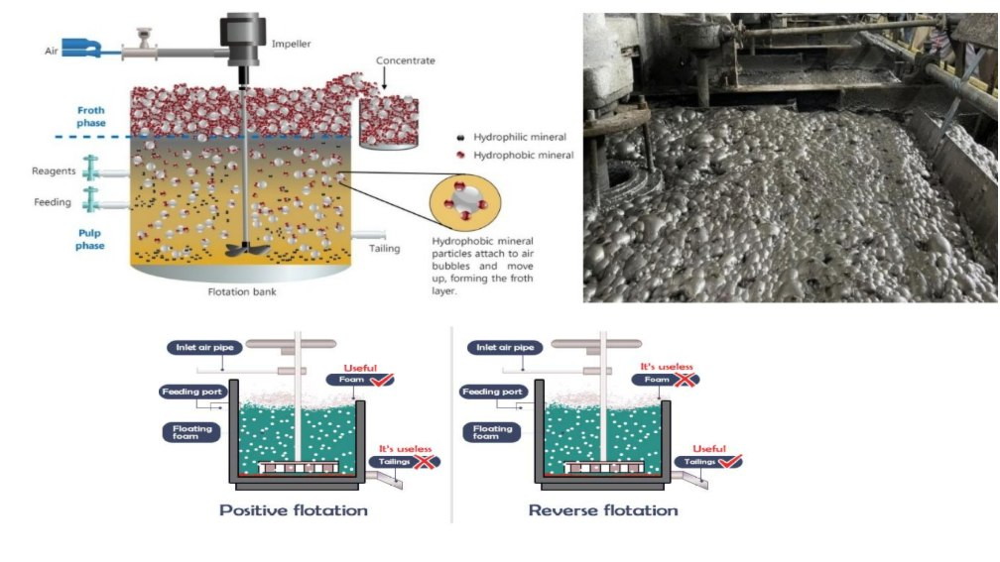

Flotation concentrate is periodically sampled to determine its purity (percentage of gangue). Higher purity in the concentrate is undesirable as it indicates that most valuable minerals had gone into the tailing. Purity measurement is usually done in a lab and can take some time before process engineers can make any adjustments based on the results. A timely investigation of concentrate purity is, therefore, a fundamental aspect for the control and optimization of the flotation process.

This project explores the application of machine learning to predict iron and gangue (silica) concentrate in the flotation output. The prediction will help process engineers assess the purity and take corrective actions in advance.

Source of dataset: https://www.kaggle.com/datasets/edumagalhaes/quality-prediction-in-a-mining-process

##**2. Data Understanding**

###**2.1. Data Definitions**

- **Date**: Data collection time. (There is imbalance in measurement of variables)
- **% Iron Feed**: Feed grade of iron-containing ore.
- **% Silica Feed**: Feed grade of silica-containing ore.
- **Starch Flow**: Depressant chemical for Iron(Fe) containing ore measured in m³/h.
- **Amina Flow**: Collector chemical for Silica containing ore measured in m³/h.
- **Ore Pulp Flow**: The amount of pulp flow fed to the flotation columns as the product of the previous process step measured in t/h.
- **Ore Pulp pH**: pH is measured in pH scale.
- **Ore Pulp Density**: The solid percent of ore fed density ranges in kg/cm³
- **Flotation Column 01, 02, 03, 04, 05, 06, 07 Air Flow**: Air Flows that goes into the flotation cell measured in Nm³/h.
- **Flotation Column 01, 02, 03, 04, 05, 06, 07 Level**: Froth level in the flotation cell measured in mm.
- **% Iron Concentrate**: Concentrate grade of iron-containing ore in percentage.
- **% Silica Concentrate**: Concentrate grade of silica-containing ore in percentage

### **2.2. Inspection of the data**

- The first column shows time and date range (march 2017 -  september 2017). 
- Measurements are taken every 5-6 hours for the first 2 columns (input - raw material).
- Measurements are taken every 1 hour for the last 2 columns (output - processed material). 
- Some columns were sampled every 20 second. 
- The second and third columns are quality measures of the iron ore pulp right before it is fed into the flotation plant. 
- From Column 4 until column 8 are the most important variables that impact in the ore quality in the end of the process. 
- From column 9 until column 22, we can see process data (froth level and air flow inside the flotation columns, which also impact in ore quality). 
- The last two columns are the final iron ore pulp quality measurement from the lab. 

### **2.3. Aim of the Project**

- To predict the percentage of output (iron and silica) concentrate in the mineral processing (reverse cationic flotation) plant

##**3. Data Collection**

###**3.1. Import Libraries**

In [1]:
import math
import random
import time
import pandas as pd
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import skew, norm
sns.set_theme(color_codes=True)
%matplotlib inline

import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.linear_model import LinearRegression, ElasticNet, BayesianRidge
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, AdaBoostRegressor
from sklearn.model_selection import KFold, cross_val_predict, GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import RepeatedKFold, cross_val_score, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error, mean_squared_log_error, mean_absolute_error, r2_score

###**3.2. Import Dataset**

In [2]:
from google.colab import drive
drive.mount('/content/drive/')
%cd /content/drive/My Drive/Flotation/

flotation = pd.read_csv('Flotation_Plant.csv')

Mounted at /content/drive/
/content/drive/My Drive/Flotation


##**4. Data Preprocessing**

###**4.1. Dataset Information**

In [3]:
flotation.sample(5).T

,436367,1616,234082,101416,346497
date,2017-07-02 07:00:00,2017-03-10 10:00:00,2017-05-16 11:00:00,2017-04-15 18:00:00,2017-06-11 12:00:00
% Iron Feed,"57,4","54,95","64,03","54,26","64,03"
% Silica Feed,"12,17","17,4","6,26","17,54","6,26"
Starch Flow,"2734,51","3133,79","226,68275","2031,63","2920,78"
Amina Flow,"335,69965","593,811","327,5023636364","573,594","533,138"
Ore Pulp Flow,"402,647","402,979","394,8718125","397,101","399,106"
Ore Pulp pH,"10,1379","9,95151","9,20937","9,29688","9,75262"
Ore Pulp Density,"1,5545745455","1,76","1,567675","1,78563","1,64958"
Flotation Column 01 Air Flow,"300,514","251,609","250,269","250,269","299,759"
Flotation Column 02 Air Flow,"299,718","250,862","251,769","252,929","298,497"


In [4]:
flotation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 737453 entries, 0 to 737452
Data columns (total 24 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   date                          737453 non-null  object
 1   % Iron Feed                   737453 non-null  object
 2   % Silica Feed                 737453 non-null  object
 3   Starch Flow                   737453 non-null  object
 4   Amina Flow                    737453 non-null  object
 5   Ore Pulp Flow                 737453 non-null  object
 6   Ore Pulp pH                   737453 non-null  object
 7   Ore Pulp Density              737453 non-null  object
 8   Flotation Column 01 Air Flow  737453 non-null  object
 9   Flotation Column 02 Air Flow  737453 non-null  object
 10  Flotation Column 03 Air Flow  737453 non-null  object
 11  Flotation Column 04 Air Flow  737453 non-null  object
 12  Flotation Column 05 Air Flow  737453 non-null  object
 13 

In [5]:
flotation.describe().T

,count,unique,top,freq
date,737453,4097,2017-06-16 15:00:00,180
% Iron Feed,737453,278,"64,03",142560
% Silica Feed,737453,293,"6,26",142560
Starch Flow,737453,409317,"2562,5",690
Amina Flow,737453,319416,"534,668",959
Ore Pulp Flow,737453,180189,"402,246",1735
Ore Pulp pH,737453,131143,"10,0591",1509
Ore Pulp Density,737453,105805,"1,75",3214
Flotation Column 01 Air Flow,737453,43675,"299,927",13683
Flotation Column 02 Air Flow,737453,80442,"255,322",1487


###**4.2.  Apply Corrections on Dataset**

**There are a lot of unreasonable values in some variables:**

- Ore Pulp Flow (plant input ore slury) is aproximately 400 t/h. 
- When we look the Ore Pulp Flow column most of the values with different decimal figures ("394,57" - "568848") in tons/hour
- Starch Flow and Amina Flow columns have different unbalanced values ("3019,53" - "367383" - "3121" - "1645,3466666667") in m³/hour
- Ore Pulp Density has not any problem ("1,74" - "1,78055")
- Ore Pulp pH must  be in range 0-14. But some values in thousands ("10068" - "9,95376", "9602")
- Flotation Column Air Flow values ("249.214" - "300.2481959288") in Nm³/h 
- Flotation Column Level values ("453.942" - "868.6261818182") in mm
- There is no problem in % Iron Concentrate, % Silica Concentrate columns




**Corrections**

In [6]:
columns_to_convert = ['% Iron Feed', '% Silica Feed', '% Iron Concentrate', 
                      '% Silica Concentrate', 'Ore Pulp Density']

for column in columns_to_convert:
    flotation[column] = flotation[column].str.replace(',', '.').astype(float).round(2)

In [7]:
columns_to_update = ["Starch Flow", "Amina Flow", "Ore Pulp Flow"]

flotation[columns_to_update] = (flotation[columns_to_update].replace(",", "", regex=True)
                               .apply(lambda x: x.str[:3] + "." + x.str[3:])
                               .astype(float).round(3))

In [8]:
flotation["Ore Pulp pH"] = (flotation["Ore Pulp pH"].str.replace(",", ".", regex=True)
                           .apply(lambda x: float(x[:2] + x[2:].replace(".", "")) 
                           if "," in x else float(x)).round(2))

In [9]:
columns_to_update = ["Flotation Column 01 Air Flow", "Flotation Column 02 Air Flow", "Flotation Column 03 Air Flow",
                     "Flotation Column 04 Air Flow", "Flotation Column 05 Air Flow", "Flotation Column 06 Air Flow",
                     "Flotation Column 07 Air Flow"]

for column in columns_to_update:
    flotation[column] = flotation[column].str.replace(",", "")
    flotation[column] = flotation[column].apply(lambda x: "{:d}.{:s}".format(int(x[:3]), x[3:]) if len(x) > 3 else np.nan)
    flotation[column] = flotation[column].astype('float64').round(3)

In [10]:
columns_to_update = ["Flotation Column 01 Level", "Flotation Column 02 Level", "Flotation Column 03 Level",
                     "Flotation Column 04 Level", "Flotation Column 05 Level", "Flotation Column 06 Level",
                     "Flotation Column 07 Level"]

for column in columns_to_update:
    flotation[column] = flotation[column].str.replace(",", "")
    flotation[column] = flotation[column].apply(lambda x: "{:d}.{:s}".format(int(x[:3]), x[3:]) if len(x) > 3 else np.nan)
    flotation[column] = flotation[column].astype('float64').round(3)

In [11]:
flotation['Airflow'] = flotation[["Flotation Column 01 Air Flow", "Flotation Column 02 Air Flow", 
                                  "Flotation Column 03 Air Flow", "Flotation Column 04 Air Flow", 
                                  "Flotation Column 05 Air Flow", "Flotation Column 06 Air Flow",
                                  "Flotation Column 07 Air Flow"]].mean(axis=1).round(3)

flotation.drop(["Flotation Column 01 Air Flow", "Flotation Column 02 Air Flow", 
                "Flotation Column 03 Air Flow", "Flotation Column 04 Air Flow", 
                "Flotation Column 05 Air Flow", "Flotation Column 06 Air Flow",
                "Flotation Column 07 Air Flow"], axis=1, inplace=True)

In [12]:
flotation['Level'] = flotation[["Flotation Column 01 Level", "Flotation Column 02 Level", 
                                "Flotation Column 03 Level", "Flotation Column 04 Level", 
                                "Flotation Column 05 Level", "Flotation Column 06 Level",
                                "Flotation Column 07 Level"]].mean(axis=1).round(3)

flotation.drop(["Flotation Column 01 Level", "Flotation Column 02 Level", 
                "Flotation Column 03 Level", "Flotation Column 04 Level", 
                "Flotation Column 05 Level", "Flotation Column 06 Level",
                "Flotation Column 07 Level"], axis=1, inplace=True)

In [13]:
flotation.sample(10).T

,401810,36683,591210,67464,196924,493435,278671,41143,249919,85538
date,2017-06-24 07:00:00,2017-03-31 18:00:00,2017-08-07 03:00:00,2017-04-07 21:00:00,2017-05-07 21:00:00,2017-07-15 12:00:00,2017-05-26 19:00:00,2017-04-01 19:00:00,2017-05-20 03:00:00,2017-04-12 02:00:00
% Iron Feed,52.11,59.72,48.81,56.91,56.65,54.77,64.03,59.72,64.03,52.75
% Silica Feed,18.64,9.22,25.31,12.62,14.83,15.21,6.26,9.22,6.26,18.87
Starch Flow,171.359,227.372,269.04,194.346,408.804,429.105,357.422,245.61,354.443,853.197
Amina Flow,246.255,523.853,485.734,517.741,489.238,514.437,547.485,570.374,406.294,534.371
Ore Pulp Flow,409.602,400.409,382.622,399.134,400.57,399.982,406.934,401.585,406.247,396.893
Ore Pulp pH,9.55,9.46,9.41,9.57,10.07,10.49,10.15,9.7,9.63,9.22
Ore Pulp Density,1.52,1.71,1.61,1.77,1.67,1.69,1.67,1.78,1.65,1.73
% Iron Concentrate,65.49,64.03,65.73,64.46,64.55,65.69,65.54,64.03,64.98,65.38
% Silica Concentrate,1.81,3.11,1.17,2.59,4.09,1.44,1.23,3.11,1.43,2.66


###**4.3. Check Missing & Duplicated Values**

In [14]:
missing_values = flotation.isnull().sum()
print(missing_values)

date                    0
% Iron Feed             0
% Silica Feed           0
Starch Flow             0
Amina Flow              0
Ore Pulp Flow           0
Ore Pulp pH             0
Ore Pulp Density        0
% Iron Concentrate      0
% Silica Concentrate    0
Airflow                 0
Level                   0
dtype: int64


- There are no missing values in the the dataframe

In [15]:
duplicates = flotation[flotation.duplicated()]
duplicates.count()

date                    1449
% Iron Feed             1449
% Silica Feed           1449
Starch Flow             1449
Amina Flow              1449
Ore Pulp Flow           1449
Ore Pulp pH             1449
Ore Pulp Density        1449
% Iron Concentrate      1449
% Silica Concentrate    1449
Airflow                 1449
Level                   1449
dtype: int64

In [16]:
# Count the number of duplicate rows
num_duplicates = flotation.duplicated().sum()
# Drop the duplicate rows from the DataFrame
flotation.drop_duplicates(inplace=True)
# Verify that duplicate rows have been eliminated
print("Number of duplicate rows:", num_duplicates)
print("Number of rows after removing duplicates:", len(flotation))

Number of duplicate rows: 1449
Number of rows after removing duplicates: 736004


In [17]:
flotation.columns

Index(['date', '% Iron Feed', '% Silica Feed', 'Starch Flow', 'Amina Flow',
       'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
       '% Iron Concentrate', '% Silica Concentrate', 'Airflow', 'Level'],
      dtype='object')

### **4.4. Rename Columns**

In [18]:
# Rename column names
old_columns = ['date', '% Iron Feed', '% Silica Feed', 
               'Starch Flow', 'Amina Flow', 'Ore Pulp Flow', 
               'Ore Pulp pH', 'Ore Pulp Density', '% Iron Concentrate', 
               '% Silica Concentrate', 'Airflow', 'Level']

new_columns = ["date","iron_feed", "silica_feed", 
               "starch_flow", "amina_flow", "pulp_flow", 
               "pulp_pH", "pulp_density", "iron_conc", 
               "silica_conc", "airflow", "level"]

flotation = flotation.rename(columns=dict(zip(old_columns, new_columns)))
flotation.columns

Index(['date', 'iron_feed', 'silica_feed', 'starch_flow', 'amina_flow',
       'pulp_flow', 'pulp_pH', 'pulp_density', 'iron_conc', 'silica_conc',
       'airflow', 'level'],
      dtype='object')

### **4.5. Grouping Rows With Hourly Frequency**

The importance of considering plant data as a holistic entity was emphasized in order to gain a comprehensive understanding. To achieve this, a loop-based analysis methodology was employed. Each row of data was treated as an individual iteration, representing a complete cycle of feeding 100 tons of ore to the plant, enriching it, and concluding the process. For the purpose of this study, each cycle was set at a duration of one hour. Consequently, a photograph of the plant was captured at hourly intervals and subjected to analysis. It is worth noting that if a more frequent and regular data collection scheme were in place, such as cycles occurring every minute, it would yield a larger dataset suitable for machine learning applications.

In [19]:
flotation['date'] = pd.to_datetime(flotation['date'])
#grouping the data according to the hours and get their average values. 
flotation_grouped = flotation.groupby(pd.Grouper(key='date',freq='H')).mean()
# cycle_data.insert(0,'Date',cycle_data.index)
flotation_grouped.reset_index(inplace = True)

#some rows have 'null' values because of timing. We need to drop them 
print('Shape of Grouped Flotation Dataset = ', flotation_grouped.shape)
flotation = flotation_grouped.dropna()
print('Shape of Grouped Flotation Dataset after drop null values = ', flotation.shape);

Shape of Grouped Flotation Dataset =  (4415, 12)
Shape of Grouped Flotation Dataset after drop null values =  (4097, 12)


The grouping process has a number of advantages and disadvantages.

**Advantages:**
Each analysis will be able to do each data cycle on an hourly frequency.
Date column can be dropped. The number of columns fell to 23.
The number of rows fell to 4097 from 737453. Every rows means calculations on computer.

**Disadvantage:** The number of rows fell to 4097 from 737453. The more rows we have for machine learning, the better results we get. This large data loss will adversely affect our estimation results.

**Dropping unnecessary date column**

In [20]:
flotation.drop(['date'], axis=1, inplace=True)

<ipython-input-20-5af2159f988b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  flotation.drop(['date'], axis=1, inplace=True)


In [21]:
missing_values = flotation.isnull().sum()
print(missing_values)

iron_feed       0
silica_feed     0
starch_flow     0
amina_flow      0
pulp_flow       0
pulp_pH         0
pulp_density    0
iron_conc       0
silica_conc     0
airflow         0
level           0
dtype: int64


In [22]:
duplicates = flotation[flotation.duplicated()]
duplicates.count()

iron_feed       0
silica_feed     0
starch_flow     0
amina_flow      0
pulp_flow       0
pulp_pH         0
pulp_density    0
iron_conc       0
silica_conc     0
airflow         0
level           0
dtype: int64

### **4.6. Reorder the Columns**

In [23]:
column_order = ['iron_feed', 'silica_feed', 'starch_flow', 'amina_flow', 'pulp_flow', 'pulp_pH',
                'pulp_density', 'airflow', 'level', 'iron_conc', 'silica_conc']

flotation = flotation.reindex(columns=column_order)
flotation.columns

Index(['iron_feed', 'silica_feed', 'starch_flow', 'amina_flow', 'pulp_flow',
       'pulp_pH', 'pulp_density', 'airflow', 'level', 'iron_conc',
       'silica_conc'],
      dtype='object')

##**5. Exploratory Data Analysis**

###**5.1. Corellation Between the Variables**

In [24]:
flotation.describe().T

,count,mean,std,min,25%,50%,75%,max
iron_feed,4097.0,56.294730,5.158347,42.740000,52.670000,56.080000,59.720000,65.780000
silica_feed,4097.0,14.651733,6.808236,1.310000,8.940000,13.850000,19.600000,33.400000
starch_flow,4097.0,338.145985,92.676974,102.567372,283.586733,335.505333,382.469011,963.312061
amina_flow,4097.0,488.160974,83.694176,242.927478,436.037967,502.454283,549.522256,736.982378
pulp_flow,4097.0,397.576497,8.370236,376.837611,398.848778,399.841022,400.582233,418.070233
pulp_pH,4097.0,9.767644,0.378189,8.750000,9.540889,9.795944,10.030944,10.810000
pulp_density,4097.0,1.680348,0.063875,1.520000,1.651389,1.695722,1.721722,1.832667
airflow,4097.0,288.656648,18.520292,221.601528,278.442433,299.804678,299.975556,316.005211
level,4097.0,467.251792,74.329034,340.585206,399.868750,456.894706,514.546728,745.230456
iron_conc,4097.0,65.050082,1.118100,62.050000,64.370000,65.210000,65.860000,68.010000


- Iron Feed: The iron feed values range from 42.74 to 65.78 with a mean of 56.295. The standard deviation indicates moderate variability in the data.

- Silica Feed: The silica feed values range from 1.31 to 33.4 with a mean of 14.652. The data shows a wider range and higher variability compared to the iron feed.

- Starch Flow: The starch flow values range from 102.567 to 963.312 with a mean of 338.146. There is a considerable range in values, indicating significant variability in starch flow.

- Amina Flow: The amina flow values range from 242.927 to 736.982 with a mean of 488.161. The data shows moderate variability.

- Pulp Flow: The pulp flow values range from 376.838 to 418.07 with a mean of 397.576. The data indicates relatively low variability.

- Pulp pH: The pulp pH values range from 8.75 to 10.81 with a mean of 9.768. The data shows moderate variability.

- Pulp Density: The pulp density values range from 1.52 to 1.833 with a mean of 1.68. The data indicates moderate variability.

- Airflow: The airflow values range from 221.602 to 316.005 with a mean of 288.657. The data shows moderate variability.

- Level: The level values range from 340.585 to 745.23 with a mean of 467.252. The data indicates moderate variability.

- Iron Concentrate: The iron concentrate values range from 62.05 to 68.01 with a mean of 65.05. The data shows relatively low variability.

- Silica Concentrate: The silica concentrate values range from 0.6 to 5.53 with a mean of 2.327. The data shows higher variability compared to the iron concentrate.

In [25]:
flotation.corr()

,iron_feed,silica_feed,starch_flow,amina_flow,pulp_flow,pulp_pH,pulp_density,airflow,level,iron_conc,silica_conc
iron_feed,1.000000,-0.971833,-0.012753,-0.096215,0.186379,0.007458,-0.136404,-0.080216,0.028466,0.055453,-0.077114
silica_feed,-0.971833,1.000000,0.029140,0.085890,-0.174834,0.008383,0.113417,0.107268,-0.049391,-0.044189,0.072782
starch_flow,-0.012753,0.029140,1.000000,0.039488,0.047801,0.230099,-0.118724,0.143422,-0.097972,0.035205,-0.043536
amina_flow,-0.096215,0.085890,0.039488,1.000000,0.237586,0.134163,0.659765,0.131672,-0.324536,-0.120415,0.171142
pulp_flow,0.186379,-0.174834,0.047801,0.237586,1.000000,0.138802,0.019916,-0.181273,-0.030256,0.096595,0.009619
pulp_pH,0.007458,0.008383,0.230099,0.134163,0.138802,1.000000,0.122639,0.182103,-0.121504,0.197962,-0.151422
pulp_density,-0.136404,0.113417,-0.118724,0.659765,0.019916,0.122639,1.000000,-0.023721,-0.148443,0.016802,0.050825
airflow,-0.080216,0.107268,0.143422,0.131672,-0.181273,0.182103,-0.023721,1.000000,-0.461957,0.050338,-0.165113
level,0.028466,-0.049391,-0.097972,-0.324536,-0.030256,-0.121504,-0.148443,-0.461957,1.000000,0.072211,-0.078572
iron_conc,0.055453,-0.044189,0.035205,-0.120415,0.096595,0.197962,0.016802,0.050338,0.072211,1.000000,-0.801212


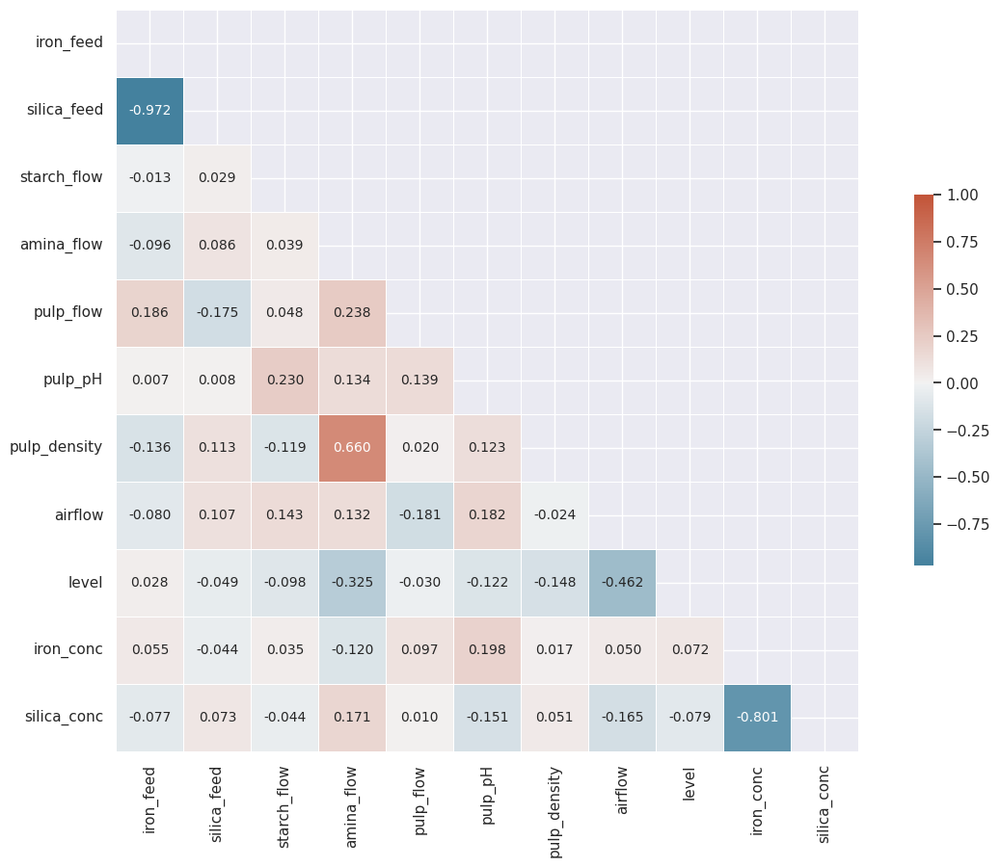

In [26]:
# Correlation Heatmap
f, ax = plt.subplots(figsize=(15, 10))
mat = flotation.corr('pearson')
mask = np.triu(np.ones_like(mat, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(mat, mask=mask, cmap=cmap, vmax=1, 
            center=0, annot = True, square=True, 
            linewidths=.5, annot_kws={"fontsize": 10}, 
            cbar_kws={"shrink": .5}, fmt='.3f')
plt.show()

**Correlation between the target variables (silica concentrate and iron concentrate) and features:**

**Silica Concentrate** has a weak positive correlation with pulp pH (0.072782), suggesting that higher pulp pH values may be associated with higher silica concentrate levels.
It has a weak negative correlation with airflow (-0.077114), indicating that higher airflow may be associated with lower silica concentrate levels.
Other variables such as iron feed, starch flow, amina flow, pulp flow, pulp density, level, and iron concentrate have correlations with silica concentrate close to zero, indicating a lack of significant linear relationship.

**Iron Concentrate** has a strong negative correlation with silica concentrate (-0.801212), indicating an inverse relationship between the two target variables. This implies that as the iron concentrate increases, the silica concentrate tends to decrease, and vice versa.
It has a weak positive correlation with pulp pH (0.197962), suggesting that higher pulp pH values may be associated with higher iron concentrate levels.
Iron Concentrate has weak correlations close to zero with the other features, including iron feed, silica feed, starch flow, amina flow, pulp flow, pulp density, airflow, and level.
Overall, the correlation analysis suggests that the target variables, silica concentrate and iron concentrate, have relatively weak correlations with the other nine features. The most notable correlation is the strong negative correlation between silica concentrate and iron concentrate, indicating an inverse relationship between them. 

**Pairplot**

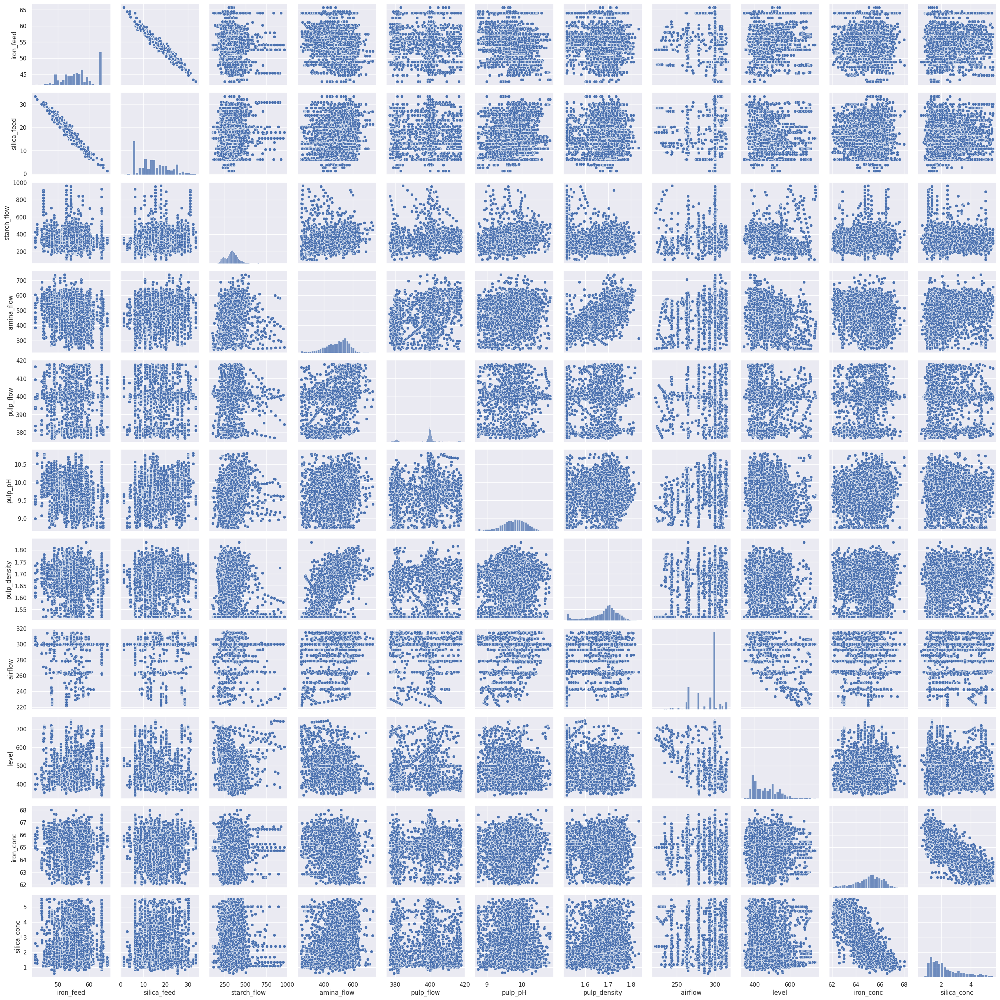

In [27]:
columns = ['iron_feed', 'silica_feed', 'starch_flow', 'amina_flow', 
           'pulp_flow', 'pulp_pH', 'pulp_density', 'airflow', 
           'level', 'iron_conc', 'silica_conc']

sns.pairplot(flotation[columns])
plt.show();

**Relationships between target variables (Silica Concentrate - Iron Concentrate) and Independent variables**

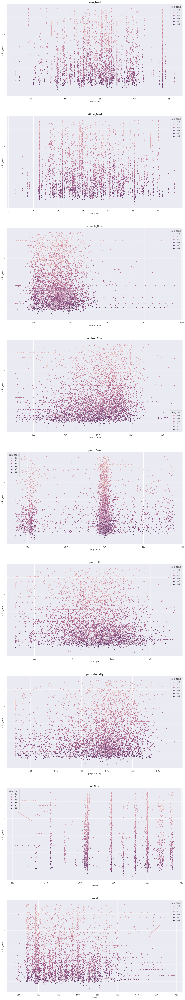

In [28]:
# Select the columns for the scatter plots
columns = ['iron_feed', 'silica_feed', 'starch_flow', 'amina_flow', 
           'pulp_flow', 'pulp_pH', 'pulp_density', 'airflow', 'level']

num_plots = min(len(columns), 9)

fig, axs = plt.subplots(9, 1, figsize=(15, 80))

axs = axs.flatten()

for i in range(num_plots):
    col = columns[i]
    sns.scatterplot(data=flotation, x=col, y='silica_conc', hue='iron_conc', ax=axs[i])
    axs[i].set_title(col, fontsize=14, fontweight='bold')

for j in range(num_plots, 9):
    fig.delaxes(axs[j])

plt.tight_layout(h_pad=5)
plt.show()

### **5.2. Target Variable (Silica) Statistics**

**Histogram of Silica Concentrate**

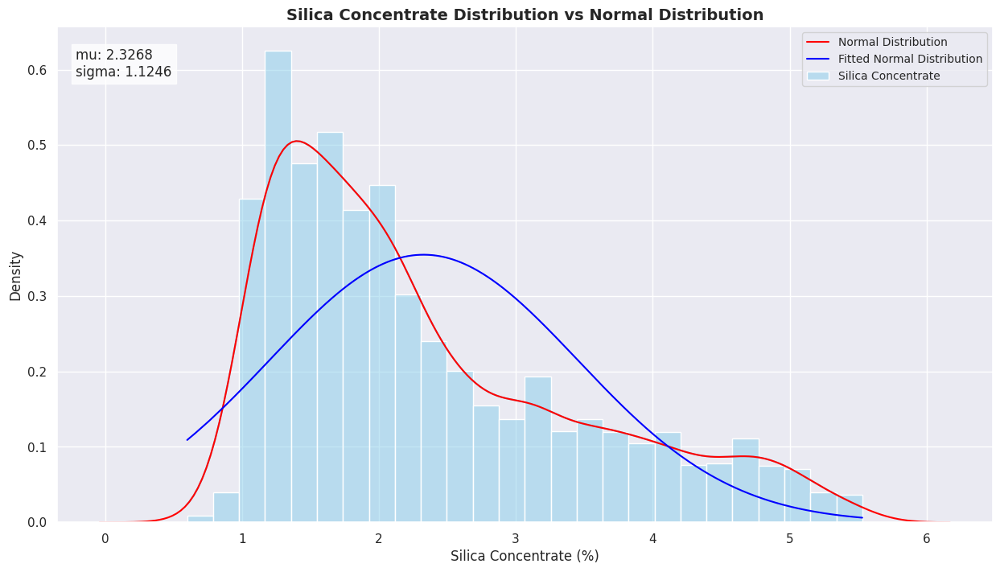

In [29]:
# Fitting normal distribution
(mu, sigma) = norm.fit(flotation['silica_conc'])

# Plotting the histogram, KDE, and fitted normal distribution
plt.figure(figsize=(15, 8))
sns.histplot(flotation['silica_conc'], kde=True, stat="density", common_norm=False,
color='skyblue', label='Silica Concentrate')
sns.kdeplot(flotation['silica_conc'], color='red', label='Normal Distribution')
sns.lineplot(x=flotation['silica_conc'], y=norm.pdf(flotation['silica_conc'], mu, sigma),
color='blue', label='Fitted Normal Distribution')

plt.text(0.02, 0.9, f"mu: {mu:.4f}\nsigma: {sigma:.4f}", 
         transform=plt.gca().transAxes,
         bbox=dict(facecolor='white', alpha=0.8), fontsize=12)

plt.title('Silica Concentrate Distribution vs Normal Distribution', fontsize=14, fontweight='bold')
plt.xlabel("Silica Concentrate (%)", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.legend(fontsize=10)
plt.show()

- mu = 2.3268 indicates that, on average, the Silica Concentrate percentage is around 2.33%. 
- sigma = The standard deviation of 1.1246 suggests that the data points are dispersed around the mean, with a typical deviation of approximately 1.12%.

- The histogram and KDE plot show the distribution of the actual data, while the red curve represents the fitted normal distribution.
- The blue line represents the line plot of the fitted normal distribution, providing a visual representation of how well the normal distribution fits the data.

**Skewness and Kurtosis**

In [30]:
t,p = stats.shapiro(flotation['silica_conc'])

print("Skewness: %f" % abs(flotation['silica_conc']).skew())
print("Kurtosis: %f" % abs(flotation['silica_conc']).kurt())
print("Shapiro_Test of t: %f" % t)
print("Shapiro_Test of p: %f" % p)

Skewness: 0.967455
Kurtosis: -0.015313
Shapiro_Test of t: 0.894797
Shapiro_Test of p: 0.000000


- The skewness of 0.967455 indicates that the distribution of the silica concentrate data is positively skewed. This means that the tail of the distribution is skewed towards higher values, and the majority of the data points are concentrated towards the lower end.

- The kurtosis of -0.015312 suggests that the distribution of the silica concentrate data has slightly lower kurtosis than a normal distribution. Negative kurtosis indicates that the distribution has lighter tails and is less peaked compared to a normal distribution. However, the kurtosis value is close to zero, suggesting that the data is approximately normally distributed in terms of its shape.

- The Shapiro-Wilk test of normality resulted in a test statistic of 0.894797 and a p-value of 0.000000. The low p-value indicates that the data significantly deviates from a normal distribution. In other words, the silica concentrate data is not normally distributed.

- The silica concentrate data exhibits positive skewness and slightly lower kurtosis. It departs from a normal distribution, as indicated by the Shapiro-Wilk test. These characteristics should be considered when analyzing the data and choosing appropriate statistical methods or models.

**Fitting the distribution of Silica Concentrate**

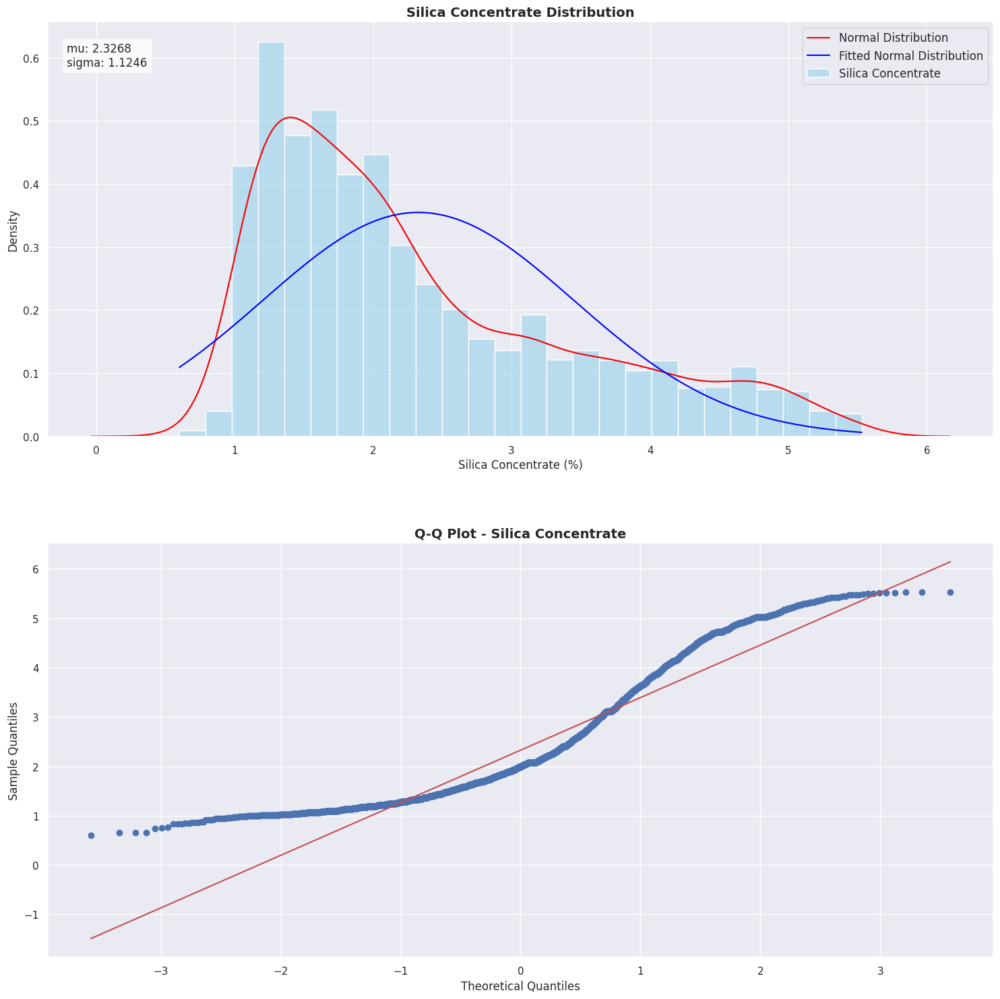

In [31]:
# Fitting normal distribution
(mu, sigma) = norm.fit(flotation['silica_conc'])

fig, axes = plt.subplots(2, 1, figsize=(15, 15))

# Histogram, KDE, and fitted normal distribution
sns.histplot(flotation['silica_conc'], kde=True, stat="density", common_norm=False, 
             color='skyblue', label='Silica Concentrate', ax=axes[0])
sns.kdeplot(flotation['silica_conc'], color='red', label='Normal Distribution', ax=axes[0])
sns.lineplot(x=flotation['silica_conc'], y=norm.pdf(flotation['silica_conc'], mu, sigma), 
             color='blue', label='Fitted Normal Distribution', ax=axes[0])

axes[0].text(0.02, 0.95, f"mu: {mu:.4f}\nsigma: {sigma:.4f}", transform=axes[0].transAxes,
             verticalalignment='top',bbox=dict(facecolor='white', alpha=0.8), fontsize=12)

axes[0].set_title('Silica Concentrate Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel("Silica Concentrate (%)", fontsize=12)
axes[0].set_ylabel("Density", fontsize=12)
axes[0].legend(loc='upper right', fontsize=12)

# Q-Q plot
stats.probplot(flotation['silica_conc'], dist='norm', plot=axes[1])
axes[1].set_title("Q-Q Plot - Silica Concentrate", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Theoretical Quantiles", fontsize=12)
axes[1].set_ylabel("Sample Quantiles", fontsize=12)

plt.tight_layout(h_pad=5)
plt.show()

- Tranform  silica concentration distribution into a normal one using log transformation.
- Plot qq-plot to see the transformation effect.

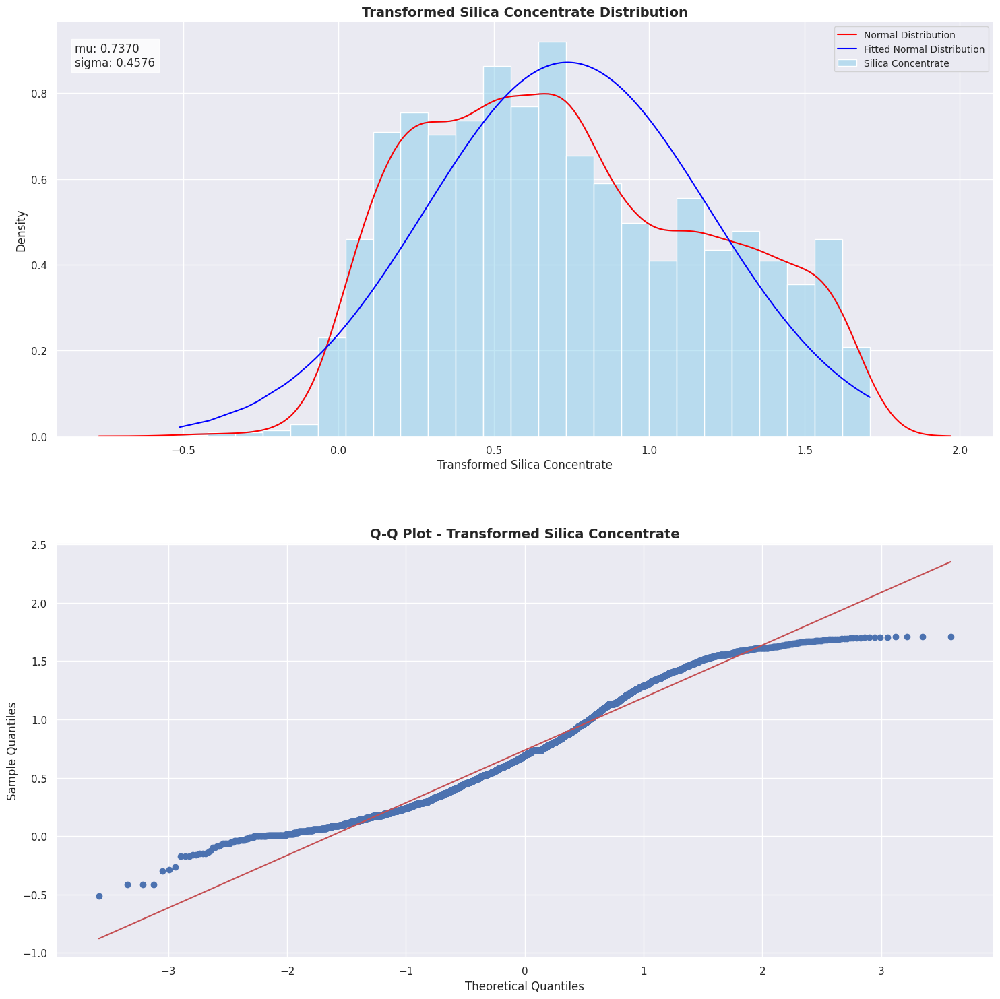

In [32]:
# Log transformation
transformed_conc = np.log(flotation['silica_conc'])

# Fitting normal distribution
(mu, sigma) = norm.fit(transformed_conc)

# Creating subplots
fig, axes = plt.subplots(2, 1, figsize=(15, 15))

sns.histplot(transformed_conc, kde=True, stat="density", common_norm=False, 
             color='skyblue', label='Silica Concentrate', ax=axes[0])
sns.kdeplot(transformed_conc, color='red', label='Normal Distribution', ax=axes[0])
sns.lineplot(x=transformed_conc, y=norm.pdf(transformed_conc, mu, sigma), 
             color='blue', label='Fitted Normal Distribution', ax=axes[0])

axes[0].set_title('Transformed Silica Concentrate Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel("Transformed Silica Concentrate", fontsize=12)
axes[0].set_ylabel("Density", fontsize=12)
axes[0].legend(loc='upper right', fontsize=10)

axes[0].text(0.02, 0.95, f"mu: {mu:.4f}\nsigma: {sigma:.4f}", transform=axes[0].transAxes,
             verticalalignment='top',bbox=dict(facecolor='white', alpha=0.8), fontsize=12)

# Q-Q plot for transformed data
stats.probplot(transformed_conc, dist='norm', plot=axes[1])
axes[1].set_title("Q-Q Plot - Transformed Silica Concentrate", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Theoretical Quantiles", fontsize=12)
axes[1].set_ylabel("Sample Quantiles", fontsize=12)

plt.tight_layout(h_pad=5)
plt.show()

- **Histogram** shows the distribution of the transformed silica concentrate variable, with the density curve overlaid. The red curve represents a normal distribution fit to the data. The blue line represents the fitted normal distribution curve, which is based on the calculated mean (mu) of 0.7370 and standard deviation (sigma) of 0.4576.

- **Q-Q plot** compares the sample quantiles of the transformed silica concentrate data to the theoretical quantiles of a normal distribution. If the data points fall approximately along the diagonal line, it suggests that the data follows a normal distribution. In this case, the transformed silica concentrate data points align quite well with the diagonal line, indicating that the log-transformed variable approximates a normal distribution.

- According to the histogram, KDE plot, fitted normal distribution curve, and Q-Q plot, the log-transformed silica concentrate variable appears to exhibit a relatively normal distribution. 


**Silica Concentrate vs Iron Concentrate**

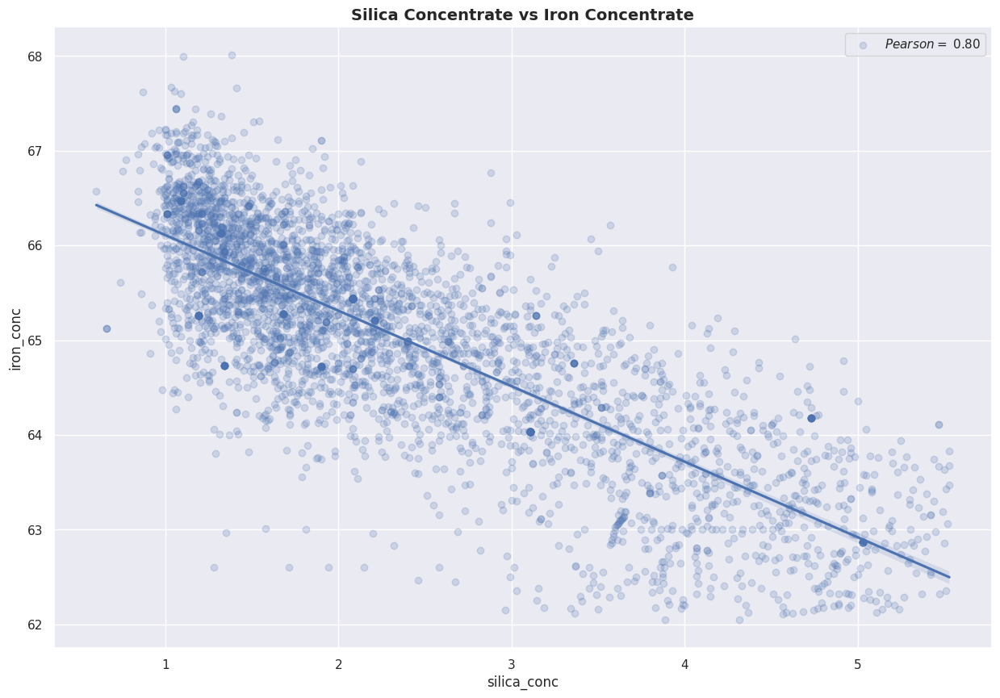

In [33]:
# iron concentrate (target_1) and silica concentrate (target_2) [Pearson = 0.8]

Pearson = 0.80
plt.figure(figsize = (15,10))
sns.regplot(data=flotation, x = 'silica_conc', y='iron_conc', scatter_kws={'alpha':0.2})
plt.title('Silica Concentrate vs Iron Concentrate', fontsize = 14, fontweight='bold')
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson)], loc = 'best')
plt.show()

Scatter plot shows the relationship between Silica Concentrate and Iron Concentrate in the flotation dataset. The Pearson correlation coefficient of -0.80 indicates a strong negative linear correlation between Silica Concentrate and Iron Concentrate in the flotation dataset.

In this case, as the Silica Concentrate increases, there is a tendency for the Iron Concentrate to decrease. This negative correlation suggests that higher levels of Silica Concentrate in the flotation process are associated with lower levels of Iron Concentrate.

While there may be some outliers in the data, the majority of the data points follow the negative correlation trend. This information is valuable in the context of the flotation process as it helps identify the inverse relationship between Silica Concentrate and Iron Concentrate.

Understanding this negative correlation is important for process optimization. It allows for monitoring and controlling Silica Concentrate levels to minimize their impact on Iron Concentrate production. By managing and reducing Silica Concentrate levels, it may be possible to improve the overall quality and yield of Iron Concentrate.

Scatter plot and the strong negative correlation between Silica Concentrate and Iron Concentrate emphasize the need to effectively control Silica Concentrate levels to enhance the production of Iron Concentrate in the flotation process.

## **6. Modelling**

### **6.1. Splitting Dataset**

**Split Dataset as X and y**

In [34]:
X = flotation.drop(['silica_conc', 'iron_conc'], axis=1)
y_Si = flotation['silica_conc']

print("Shape of X:", X.shape)
print("Shape of y_Si:", y_Si.shape)

Shape of X: (4097, 9)
Shape of y_Si: (4097,)


**Split (train, validation, test)**

In [35]:
X_train, X_val, y_train, y_val = train_test_split(X, y_Si, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, test_size=0.5, random_state=42)

print("Shape of X_train:", X_train.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of X_test:", X_test.shape)

Shape of X_train: (3277, 9)
Shape of X_val: (410, 9)
Shape of X_test: (410, 9)


### **6.2. MSE - MAE - R^2**

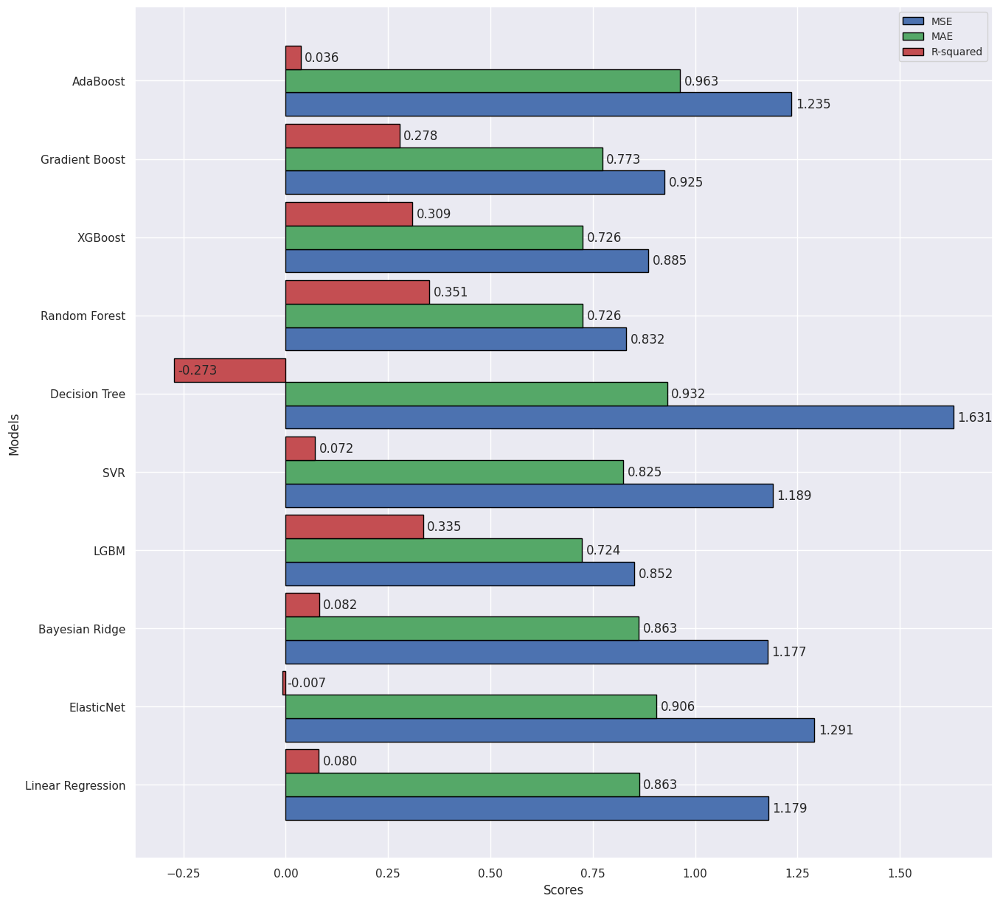

,Model,MSE,MAE,R^2,Training Time,Prediction Time
0,Random Forest,0.832059,0.725653,0.350882,2.535604,0.025449
1,LGBM,0.851956,0.724352,0.335360,2.409639,0.004459
2,XGBoost,0.885358,0.725713,0.309302,0.680788,0.005079
3,Gradient Boost,0.925278,0.773157,0.278159,1.026426,0.002677
4,Bayesian Ridge,1.177163,0.862712,0.081655,0.024380,0.002093
5,Linear Regression,1.178785,0.863385,0.080390,0.039967,0.006883
6,SVR,1.189268,0.824892,0.072211,0.579547,0.066727
7,AdaBoost,1.235395,0.963015,0.036226,0.216490,0.003961
8,ElasticNet,1.291054,0.905793,-0.007195,0.032667,0.001963
9,Decision Tree,1.631202,0.931876,-0.272556,0.042145,0.001812


In [36]:
# Define the models and their corresponding names
models = [
    (LinearRegression(), 'Linear Regression'),
    (ElasticNet(), 'ElasticNet'),
    (BayesianRidge(compute_score=True), 'Bayesian Ridge'),
    (LGBMRegressor(objective='regression'), 'LGBM'),
    (SVR(), 'SVR'),
    (DecisionTreeRegressor(), 'Decision Tree'),
    (RandomForestRegressor(), 'Random Forest'),
    (XGBRegressor(), 'XGBoost'),
    (GradientBoostingRegressor(), 'Gradient Boost'),
    (AdaBoostRegressor(), 'AdaBoost')]

mse_scores = []
mae_scores = []
r2_scores = []
train_times = []
predict_times = []

# Iterate over the models
for model, model_name in models:
    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('regressor', model)])

    # Measure training time
    start_time = time.time()
    pipeline.fit(X_train, y_train)
    train_time = time.time() - start_time

    # Measure prediction time
    start_time = time.time()
    val_pred = pipeline.predict(X_val)
    predict_time = time.time() - start_time

    # Calculate evaluation metrics
    mse = mean_squared_error(y_val, val_pred)
    mae = mean_absolute_error(y_val, val_pred)
    r2 = r2_score(y_val, val_pred)

    # Append the scores and times to the lists
    mse_scores.append(mse)
    mae_scores.append(mae)
    r2_scores.append(r2)
    train_times.append(train_time)
    predict_times.append(predict_time)

# Plot evaluation metrics
bar_width = 0.3
r1 = np.arange(len(mse_scores))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

plt.figure(figsize=(15, 15))
plt.barh(r1, mse_scores, color='b', height=bar_width, edgecolor='black', label='MSE')
plt.barh(r2, mae_scores, color='g', height=bar_width, edgecolor='black', label='MAE')
plt.barh(r3, r2_scores, color='r', height=bar_width, edgecolor='black', label='R-squared')
plt.ylabel('Models', fontsize=12)
plt.xlabel('Scores', fontsize=12)
plt.yticks([r + bar_width for r in range(len(mse_scores))], [model_name for _, model_name in models])
plt.legend(loc='upper right', fontsize=10)

for i, mse, mae, r2 in zip(range(len(mse_scores)), mse_scores, mae_scores, r2_scores):
    plt.text(mse + 0.01, i - 0.05, f'{mse:.3f}', fontsize=12)
    plt.text(mae + 0.01, i + bar_width - 0.05, f'{mae:.3f}', fontsize=12)
    plt.text(r2 + 0.01, i + 2 * bar_width - 0.05, f'{r2:.3f}', fontsize=12)

plt.show()

# Write the evaluation metric scores and execution times
scores_df = pd.DataFrame({'Model': [model_name for _, model_name in models],
                          'MSE': mse_scores,
                          'MAE': mae_scores,
                          'R^2': r2_scores,
                          'Training Time': train_times,
                          'Prediction Time': predict_times})

scores_df = scores_df.sort_values(by='MSE', ascending=True)
scores_df = scores_df.reset_index(drop=True)
scores_df

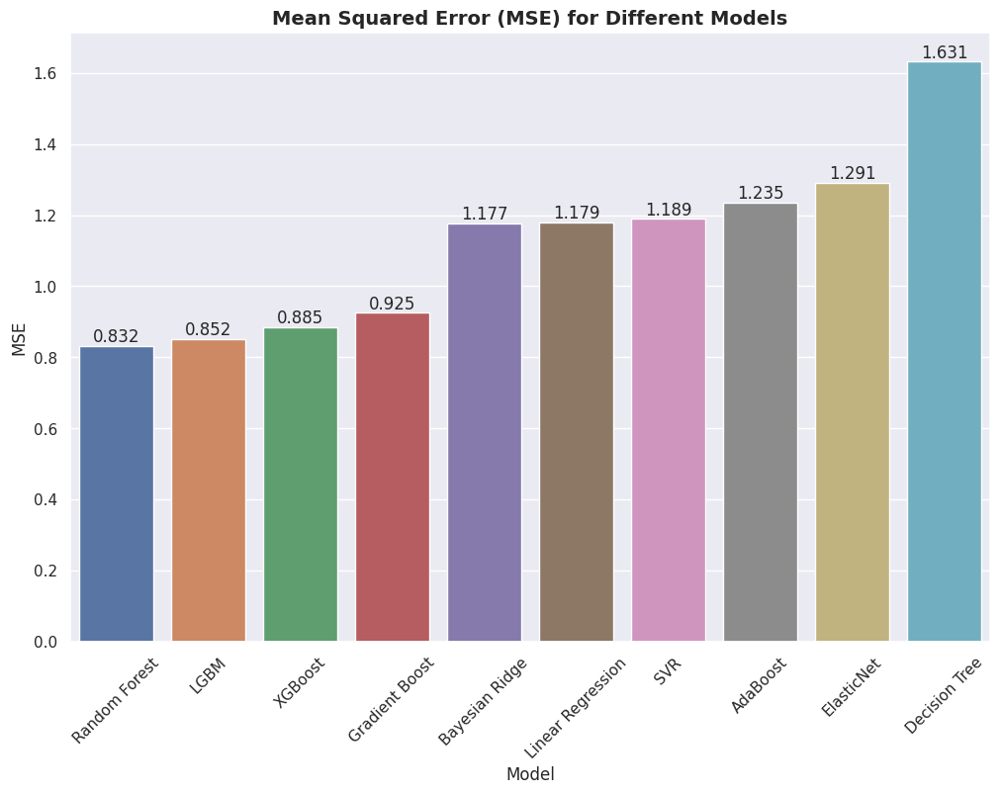

In [37]:
plt.figure(figsize=(12, 8))
sns.barplot(x='Model', y='MSE', data=scores_df)
plt.xlabel('Model', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.xticks(rotation=45)
plt.title('Mean Squared Error (MSE) for Different Models', fontsize = 14, fontweight='bold')

for i, row in scores_df.iterrows():
    plt.text(i, row['MSE'], f'{row["MSE"]:.3f}', ha='center', va='bottom')

plt.show()

Among the models evaluated, LGBM performs the best with the lowest mean squared error (MSE) and mean absolute error (MAE), indicating higher accuracy in prediction. It also has the highest R^2 value, suggesting that it explains a significant portion of the variance in the data. Random Forest comes in second place, performing slightly worse than LGBM but still showing good performance. XGBoost follows with slightly higher MSE, MAE, and slightly lower R^2 compared to Random Forest.

On the other hand, Gradient Boost, SVR, Bayesian Ridge, Linear Regression, AdaBoost, ElasticNet, and Decision Tree perform worse than the top models. They have higher MSE and MAE values, indicating less accurate predictions, and lower R^2 values, indicating a weaker ability to explain the variance in the data. Decision Tree performs the worst among all the models, with the highest MSE, MAE, and a significantly negative R^2 value.

Overall, LGBM, Random Forest, and XGBoost show better performance, while the remaining models struggle to accurately capture the patterns in the data and explain its variance.

### **6.3. Cross validation**

**Creation of the RMSE metric**

In [38]:
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, X, target_log, 
                scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

**10 Fold Cross validation**

In [39]:
kf = KFold(n_splits=10, random_state=42, shuffle=True)

# Define the models and their corresponding names
models = [
    (LinearRegression(), 'Linear Regression'),
    (ElasticNet(), 'ElasticNet'),
    (BayesianRidge(compute_score=True), 'Bayesian Ridge'),
    (LGBMRegressor(objective='regression'), 'LGBM'),
    (SVR(), 'SVR'),
    (DecisionTreeRegressor(), 'Decision Tree'),
    (RandomForestRegressor(), 'Random Forest'),
    (xgb.XGBRegressor(), 'XGBoost'),
    (GradientBoostingRegressor(), 'Gradient Boost'),
    (AdaBoostRegressor(), 'AdaBoost')]

cv_scores = []
cv_std = []
execution_times = []

# Perform cross-validation for each model
for model, model_name in models:
    start_time = time.time()
    scores = cross_val_score(model, X_train, y_train, 
                             scoring='neg_root_mean_squared_error', cv=kf)
    end_time = time.time()
    execution_time = end_time - start_time

    cv_scores.append(-scores.mean())
    cv_std.append(scores.std())
    execution_times.append(execution_time)

# Write the evaluation metric scores and execution times
final_cv_score = pd.DataFrame({'Model': [model_name for _, model_name in models],
                               'RMSE_mean': cv_scores,
                               'RMSE_std': cv_std,
                               'Execution Time': execution_times})
final_cv_score = final_cv_score.sort_values(by='RMSE_mean', ascending=True)
final_cv_score = final_cv_score.reset_index(drop=True)
final_cv_score

,Model,RMSE_mean,RMSE_std,Execution Time
0,LGBM,0.911338,0.046524,1.406555
1,Random Forest,0.925387,0.043308,26.926497
2,XGBoost,0.935426,0.047937,6.663218
3,Gradient Boost,0.952054,0.041043,10.423248
4,Linear Regression,1.047034,0.039261,0.079003
5,Bayesian Ridge,1.047390,0.039381,0.191722
6,AdaBoost,1.072902,0.029888,1.897816
7,ElasticNet,1.073196,0.039014,0.062319
8,SVR,1.097981,0.041051,6.896938
9,Decision Tree,1.307939,0.081302,0.365671


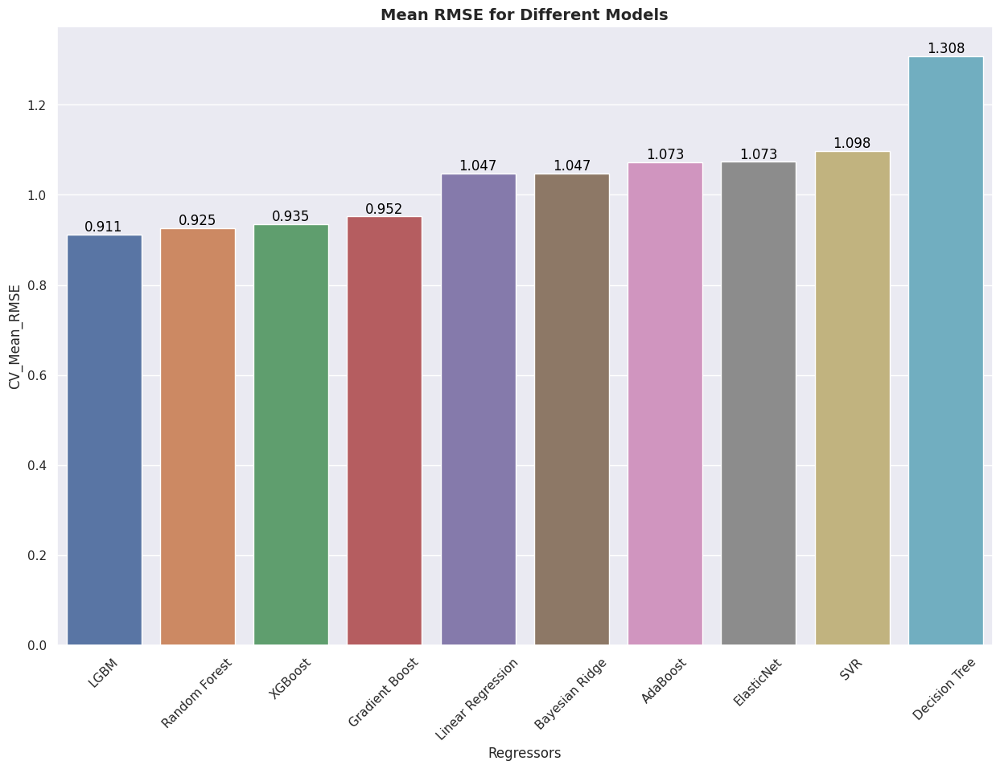

In [40]:
plt.figure(figsize=(15, 10))
sns.barplot(x='Model', y='RMSE_mean', data=final_cv_score)
plt.xlabel('Regressors', fontsize=12)
plt.ylabel('CV_Mean_RMSE', fontsize=12)
plt.xticks(rotation=45)
plt.title('Mean RMSE for Different Models', fontsize = 14, fontweight='bold')

for i, row in final_cv_score.iterrows():
    plt.text(i, row['RMSE_mean'], f'{row["RMSE_mean"]:.3f}', color='black', ha='center', va='bottom')
    
plt.show()

The evaluation of various regression models was performed using two different approaches:

**Individual Model Evaluation:**

- Ten different regression models were trained and evaluated individually using mean squared error (MSE), mean absolute error (MAE), and R-squared metrics.
- The models considered were Linear Regression, ElasticNet, Bayesian Ridge, LGBM, SVR, Decision Tree, Random Forest, XGBoost, Gradient Boost, and AdaBoost.
- The evaluation results showed that Random Forest and LGBM performed relatively better in terms of MSE, MAE, and R-squared metrics.
- The models at the bottom of the list, such as Decision Tree and ElasticNet, showed relatively poorer performance.


**Cross-Validated Model Evaluation:**

- Ten-fold cross-validation was performed for the same regression models to obtain more robust evaluation metrics.
- The evaluation metric used was root mean squared error (RMSE).
- The cross-validated results showed that LGBM had the lowest RMSE_mean, followed by Random Forest and XGBoost.
- Decision Tree had the highest RMSE_mean among the models considered.
- Based on these evaluations, **LGBM, Random Forest, and XGBoost consistently performed well across both individual and cross-validated evaluations.** These models are likely to be good choices for predicting the target variable in this regression problem.

### **6.4. Hyperparameter Optimization**

**Perform Grid Search**

In [41]:
# Define the model
model = RandomForestRegressor()

# Define the hyperparameter grid
param_grid = {'n_estimators': [100, 200, 300],
              'max_depth': [None, 5, 10],
              'min_samples_split': [2, 5, 10]}

# Perform Grid Search
start_time = time.time()
grid_search = GridSearchCV(model, param_grid, cv=5, 
                           scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)
end_time = time.time()
grid_search_time = end_time - start_time

# Get the best model and hyperparameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

# Fit the best model on the training data
start_time = time.time()
best_model.fit(X_train, y_train)
end_time = time.time()
fit_time = end_time - start_time

# Evaluate the best model on the validation data
start_time = time.time()
val_pred = best_model.predict(X_val)
end_time = time.time()
prediction_time = end_time - start_time

# Calculate evaluation metrics
mse = mean_squared_error(y_val, val_pred)
mae = mean_absolute_error(y_val, val_pred)
r2 = r2_score(y_val, val_pred)

# Print the results
print(f"Best Hyperparameters: {best_params}")
print(f"MSE: {mse:.3f}")
print(f"MAE: {mae:.3f}")
print(f"R^2: {r2:.3f}")
print(f"Grid Search Time: {grid_search_time:.3f} seconds")
print(f"Fit Time: {fit_time:.3f} seconds")
print(f"Prediction Time: {prediction_time:.3f} seconds")

Best Hyperparameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}
MSE: 0.850
MAE: 0.735
R^2: 0.337
Grid Search Time: 429.038 seconds
Fit Time: 7.624 seconds
Prediction Time: 0.060 seconds


In [42]:
# Define the model
model = LGBMRegressor(objective='regression')

# Define the hyperparameter grid
param_grid = {'n_estimators': [100, 200, 300],
              'max_depth': [None, 5, 10]}

# Perform Grid Search
start_time = time.time()
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)
end_time = time.time()
grid_search_time = end_time - start_time

# Get the best model and hyperparameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

# Fit the best model on the training data
start_time = time.time()
best_model.fit(X_train, y_train)
end_time = time.time()
fit_time = end_time - start_time

# Evaluate the best model on the validation data
start_time = time.time()
val_pred = best_model.predict(X_val)
end_time = time.time()
prediction_time = end_time - start_time

# Calculate evaluation metrics
mse = mean_squared_error(y_val, val_pred)
mae = mean_absolute_error(y_val, val_pred)
r2 = r2_score(y_val, val_pred)

# Print the results
print(f"Best Hyperparameters: {best_params}")
print(f"MSE: {mse:.3f}")
print(f"MAE: {mae:.3f}")
print(f"R^2: {r2:.3f}")
print(f"Grid Search Time: {grid_search_time:.3f} seconds")
print(f"Fit Time: {fit_time:.3f} seconds")
print(f"Prediction Time: {prediction_time:.3f} seconds")

Best Hyperparameters: {'max_depth': None, 'n_estimators': 100}
MSE: 0.844
MAE: 0.724
R^2: 0.342
Grid Search Time: 11.559 seconds
Fit Time: 0.127 seconds
Prediction Time: 0.004 seconds


**Comparing RandomForest vs LGBMRegressor models**:

**Hyperparameters**: The Random Forest model had an additional hyperparameter, 'min_samples_split,' which was optimized during grid search. The LGBM model had fewer hyperparameters to tune.

**Performance**: The LGBM model achieved slightly lower MSE and MAE values compared to the Random Forest model, indicating better accuracy in predicting the target variable. Additionally, the LGBM model had a slightly higher R^2 value, indicating a better fit to the data.

**Computational Efficiency**: The LGBM model outperformed the Random Forest model in terms of computational efficiency. It had significantly shorter grid search, fit, and prediction times. This suggests that the LGBM model is more efficient and can process data more quickly.

Overall, both models showed reasonable performance, with the LGBM model slightly outperforming the Random Forest model in terms of accuracy. However, the Random Forest model had a longer training time and slightly higher prediction time. Depending on the specific requirements of the project, such as the trade-off between accuracy and efficiency, either model could be a viable choice.

## **9. Conclussion**

Based on the analysis and modeling performed for the Flotation dataset, specifically focusing on predicting the silica concentrate, the following overall conclusions can be drawn:

**Dataset**: The Flotation dataset contains information about various features related to the flotation process. The target variable of interest is the silica concentrate, which indicates the concentration of silica in the final product.

**Data Preprocessing**: The dataset underwent preprocessing steps, including handling missing values, encoding categorical variables, and splitting the data into training and validation sets. These steps ensured that the data was in a suitable format for model training.

**Exploratory Data Analysis (EDA)**: EDA was conducted to gain insights into the distribution and relationships among the variables. The analysis aimed to identify patterns, correlations, and any potential outliers or anomalies in the data.

**Feature Engineering**: Feature engineering techniques were applied to create new features or transform existing ones. This process aimed to capture relevant information and enhance the predictive power of the models.

**Model Evaluation**: Several regression models were trained and evaluated using appropriate evaluation metrics such as mean squared error (MSE), mean absolute error (MAE), and R-squared (R^2). Cross-validation and grid search were utilized to optimize the hyperparameters and assess the performance of the models.

**Model Comparison**: The performance of different models, such as Random Forest and LGBM (Light Gradient Boosting Machine), was compared based on their hyperparameters, accuracy metrics, and computational efficiency. The model that achieved better performance on the silica concentrate prediction task was identified.

Finally, **the selected model (LGBM) with optimized hyperparameters demonstrated superior predictive performance for the silica concentrate target variable**. It achieved lower MSE and MAE values and potentially higher R^2 compared to other models considered. The model's computational efficiency was also taken into account to ensure its practical applicability.
